# [CS 6476 Project 2: Local Feature Matching](https://www.cc.gatech.edu/~hays/compvision/proj2/)

This iPython notebook:  
(1) Loads and resizes images  
(2) Finds interest points in those images                 (you code this)  
(3) Describes each interest point with a local feature    (you code this)  
(4) Finds matching features                               (you code this)  
(5) Visualizes the matches  
(6) Evaluates the matches based on ground truth correspondences  

## Setup

In [59]:
%matplotlib inline
# %matplotlib notebook
%load_ext autoreload
%autoreload 2
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from student_feature_matching import match_features
from student_sift import get_features
from student_harris import get_interest_points
from IPython.core.debugger import set_trace

# Notre Dame
image1 = load_image('../data/Notre Dame/921919841_a30df938f2_o.jpg')
image2 = load_image('../data/Notre Dame/4191453057_c86028ce1f_o.jpg')
eval_file = '../data/Notre Dame/921919841_a30df938f2_o_to_4191453057_c86028ce1f_o.pkl'
# eval_file ='../eval_file.pkl'

# # Mount Rushmore -- this pair is relatively easy (still harder than Notre Dame, though)
# image1 = load_image('../data/Mount Rushmore/9021235130_7c2acd9554_o.jpg')
# image2 = load_image('../data/Mount Rushmore/9318872612_a255c874fb_o.jpg')
# eval_file = '../data/Mount Rushmore/9021235130_7c2acd9554_o_to_9318872612_a255c874fb_o.pkl'

# # Episcopal Gaudi -- This pair is relatively difficult
# image1 = load_image('../data/Episcopal Gaudi/4386465943_8cf9776378_o.jpg')
# image2 = load_image('../data/Episcopal Gaudi/3743214471_1b5bbfda98_o.jpg')
# eval_file = '../data/Episcopal Gaudi/4386465943_8cf9776378_o_to_3743214471_1b5bbfda98_o.pkl'

                    
scale_factor = 0.5
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

feature_width = 16 # width and height of each local feature, in pixels. 
image1_bw.shape



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


(1024, 768)

## Hyper parameters
R threshold: 0.01* Rmax
sobel k=5 gaussian k=9, sigma=2
stronger distance*1.1
n=1500

## Find distinctive points in each image (Szeliski 4.1.1)

1280.0
[1280.           57.34989102   96.75541329 ...   26.1658174    71.70676398
   44.75321218]
[   0  107   96 ... 8132 9784 9235]
1270.0
[1270.           45.52142353   63.50118109 ...   11.30176977   26.07834351
    2.90688837]
[    0    12    22 ...  4763 10670  5326]
1500 corners in image 1, 1500 corners in image 2


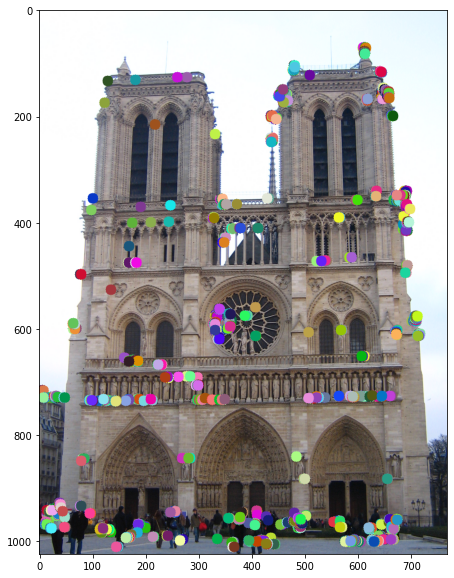

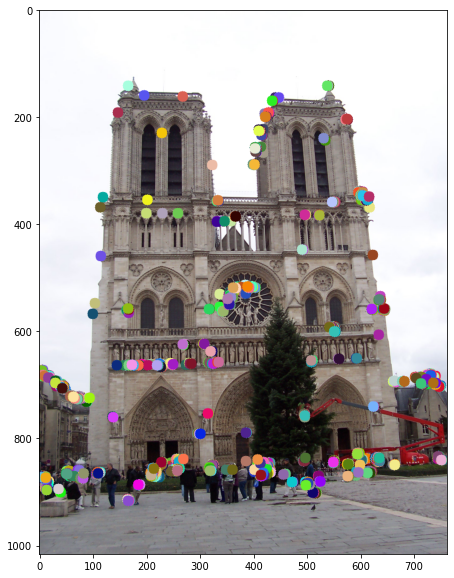

In [60]:
x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10,10))
plt.imshow(c1)
plt.figure(figsize=(10,10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


## Create feature vectors at each interest point (Szeliski 4.1.2)

In [61]:
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)

(768, 1024)
(762, 1016)


## Match features (Szeliski 4.1.3)

In [62]:
print(image1_features)
image1_features.shape

[[1.57792714e-01 1.78542996e-01 1.57745972e-01 ... 1.96179333e-04
  9.78777994e-02 1.09405317e-01]
 [5.43005449e-03 3.73252143e-03 3.73901759e-03 ... 0.00000000e+00
  1.29176535e-02 3.72246873e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.91390524e-03
  0.00000000e+00 0.00000000e+00]
 ...
 [3.36365570e-03 2.01122650e-04 8.02664458e-03 ... 8.06580896e-02
  6.46582409e-02 1.66909796e-01]
 [1.06031614e-02 5.11372060e-03 8.94016354e-03 ... 1.19448543e-01
  3.80493827e-02 2.57616501e-02]
 [3.73990727e-02 4.61217320e-03 1.86987269e-03 ... 0.00000000e+00
  7.04992685e-02 6.52117285e-02]]


(1500, 128)

In [63]:
matches, confidences = match_features(image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))

80 matches from 1500 corners


## Visualization

You might want to set 'num_pts_to_visualize' and 'num_pts_to_evaluate' to some constant (e.g. 100) once you start detecting hundreds of interest points, otherwise things might get too cluttered. You could also threshold based on confidence.  
  
There are two visualization functions below. You can comment out one of both of them if you prefer.

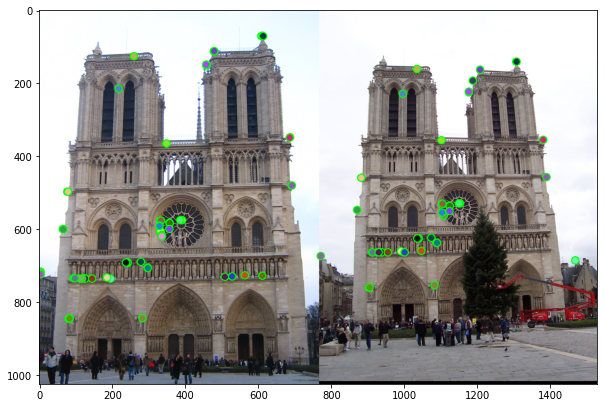

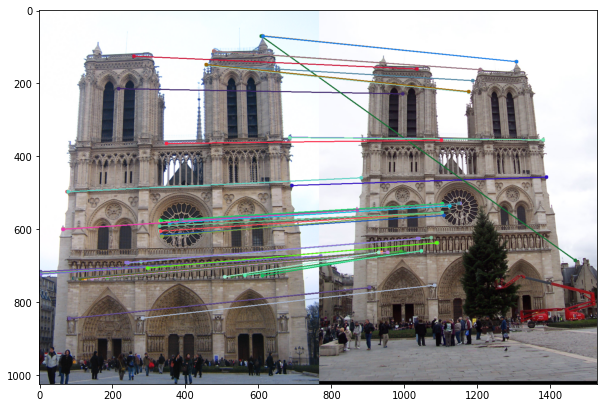

In [64]:
from utils import show_correspondence_circles,show_correspondence_lines
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                    x1[matches[:num_pts_to_visualize, 0]], y1[matches[:num_pts_to_visualize, 0]],
                    x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10,10)); plt.imshow(c1)
plt.savefig('../results/vis_circles.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                    x1[matches[:num_pts_to_visualize, 0]], y1[matches[:num_pts_to_visualize, 0]],
                    x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10,10)); plt.imshow(c2)
plt.savefig('../results/vis_lines.jpg', dpi=1000)

Comment out the function below if you are not testing on the Notre Dame, Episcopal Gaudi, and Mount Rushmore image pairs--this evaluation function will only work for those which have ground truth available.  
  
You can use `annotate_correspondences/collect_ground_truth_corr.py` to build the ground truth for other image pairs if you want, but it's very tedious. It would be a great service to the class for future years, though!

In [65]:
# num_pts_to_evaluate = len(matches)
# # num_pts_to_evaluate = 100
# _, c = evaluate_correspondence(image1, image2, eval_file, scale_factor,
#                         x1[matches[:num_pts_to_evaluate, 0]], y1[matches[:num_pts_to_evaluate, 0]],
#                         x2[matches[:num_pts_to_evaluate, 1]], y2[matches[:num_pts_to_evaluate, 1]])
# plt.figure(); plt.imshow(c)
# plt.savefig('../results/eval.jpg', dpi=1000)

## More examples

### Mount Rushmore

647.800123494894
[647.80012349  46.10791689  43.35308524 ...   3.00832179   4.3829214
  12.97574661]
[   0   19    4 ... 6014 5304 5203]
703.600028425241
[7.03600028e+02 2.22460176e+02 4.00281151e+01 ... 1.41421356e-01
 5.40000000e+00 9.01997783e+00]
[    0     1    27 ...  4794 19326  8223]
1500 corners in image 1, 1500 corners in image 2


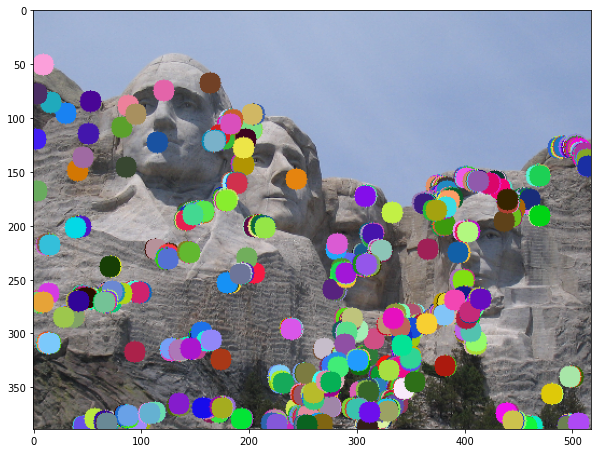

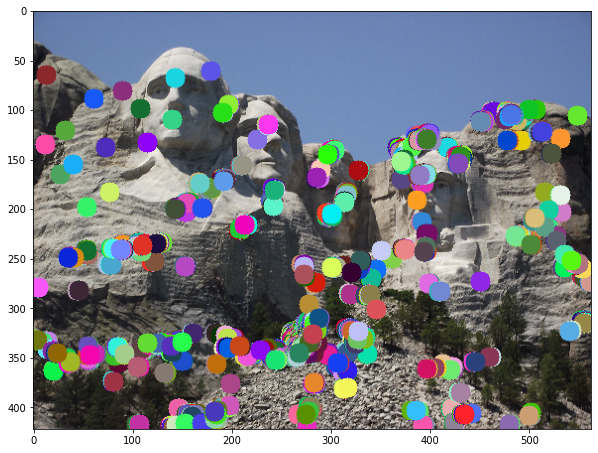

In [66]:
image1 = load_image('../data/Mount Rushmore/9021235130_7c2acd9554_o.jpg')
image2 = load_image('../data/Mount Rushmore/9318872612_a255c874fb_o.jpg')
scale_factor = 0.2
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


In [67]:
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))


(518, 389)
(563, 422)
51 matches from 1500 corners


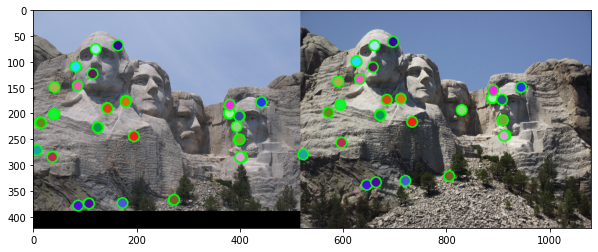

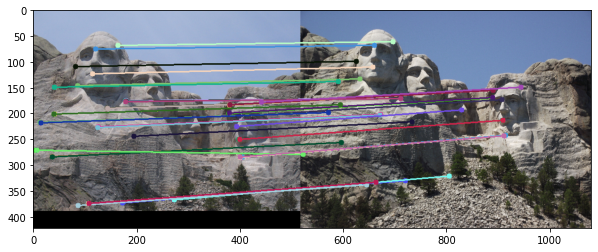

In [68]:
from utils import show_correspondence_circles, show_correspondence_lines
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_mount.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_mount.jpg', dpi=1000)


### Episcopal Gaudi

973.4988443752771
[9.73498844e+02 4.87898555e+01 9.13315389e+01 ... 2.45967478e+00
 4.56508488e+00 8.06225775e-01]
[    0    44    95 ...  3284 20599 16143]
1200.0
[1200.          100.72144757   98.07201436 ...   19.28989373   27.05734651
   11.38859078]
[   0    3   50 ... 4799 5867 2830]
1500 corners in image 1, 1500 corners in image 2


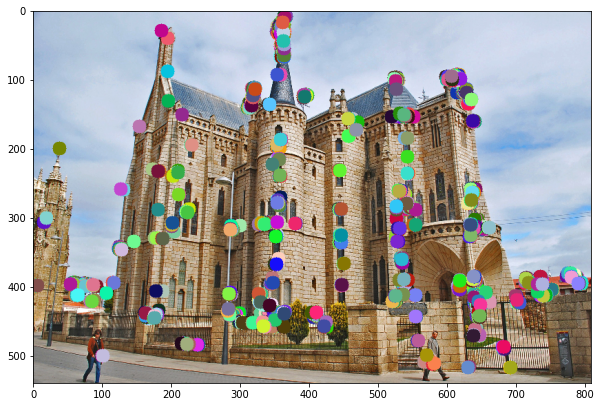

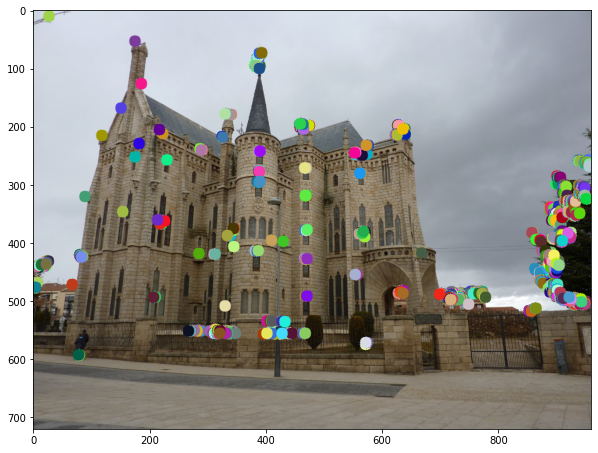

In [69]:
image1 = load_image('../data/Episcopal Gaudi/3743214471_1b5bbfda98_o.jpg')
image2 = load_image('../data/Episcopal Gaudi/4386465943_8cf9776378_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=0.6, fy=0.6)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(810, 540)
(960, 720)
47 matches from 1500 corners


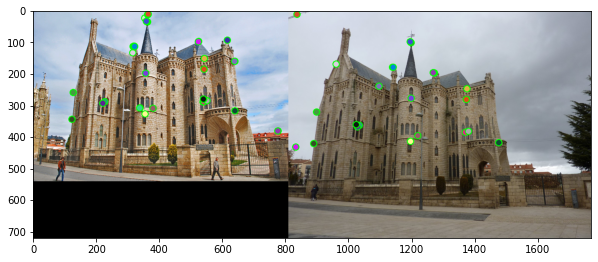

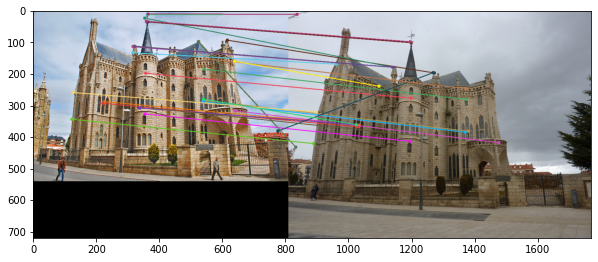

In [70]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_gaudi.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_gaudi.jpg', dpi=1000)


### House

720.0
[720.         364.98291741  14.49586148 ...   1.3          6.84762733
   1.7691806 ]
[   0    1   37 ... 2792 1587 1728]
720.0
[720.         272.01444815  31.44932432 ...  26.58194876   2.19317122
  19.40025773]
[   0    1  179 ... 3777 1749 3367]
1500 corners in image 1, 1500 corners in image 2


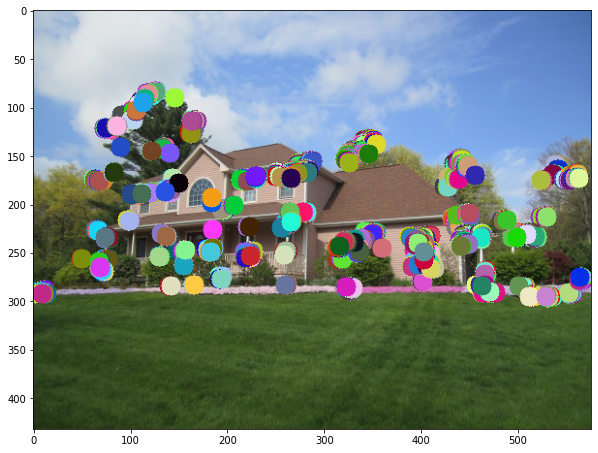

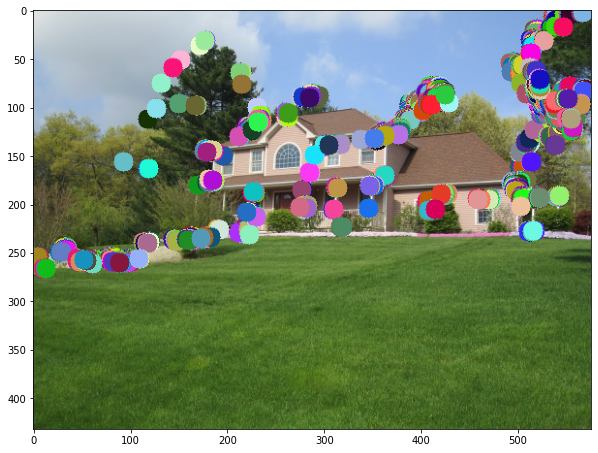

In [71]:
image1 = load_image('../data/House/IMG_0485.JPG')
image2 = load_image('../data/House/IMG_0488.JPG')
scale_factor = 0.5
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(576, 432)
(576, 432)
118 matches from 1500 corners


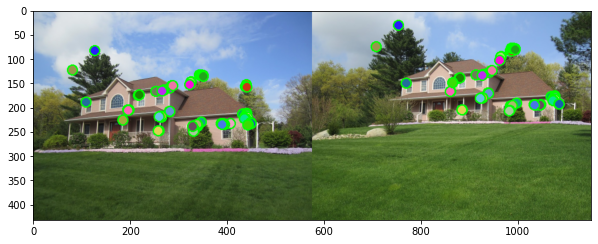

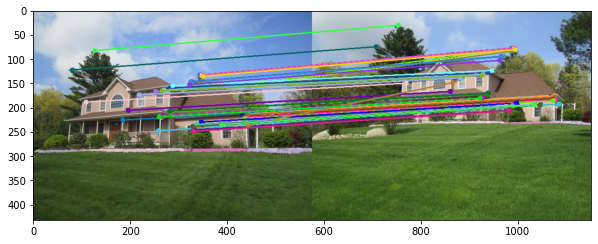

In [72]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_house.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_house.jpg', dpi=1000)


### Capricho Gaudi

1152.200069432388
[1152.20006943   45.3401588    82.3322537  ...    1.88679623    6.28171951
   45.3629805 ]
[    0    97   550 ...  9430 10043  5693]
1152.200069432388
[1152.20006943   61.51105592   16.34655927 ...    1.36014705   20.89425758
    1.94164878]
[   0   10   27 ... 3514 6541 5788]
1500 corners in image 1, 1500 corners in image 2


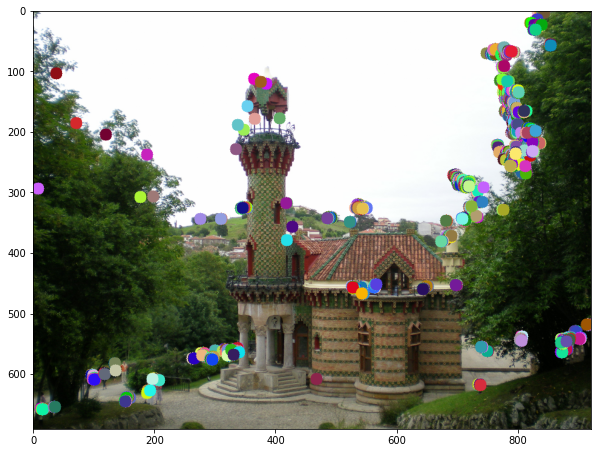

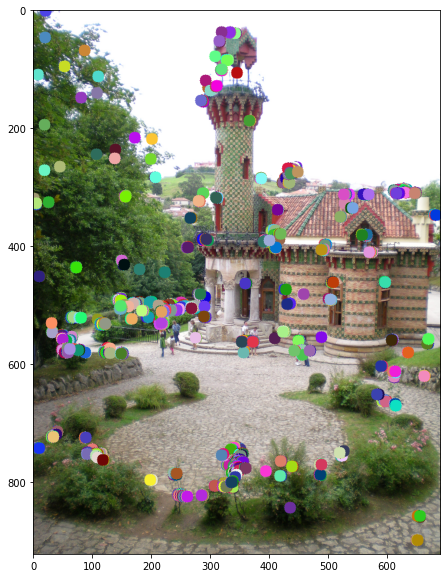

In [73]:
image1 = load_image('../data/Capricho Gaudi/3872126052_0e08c5a830_o.jpg')
image2 = load_image('../data/Capricho Gaudi/3872129062_9a1b8c98d7_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(922, 691)
(691, 922)
18 matches from 1500 corners


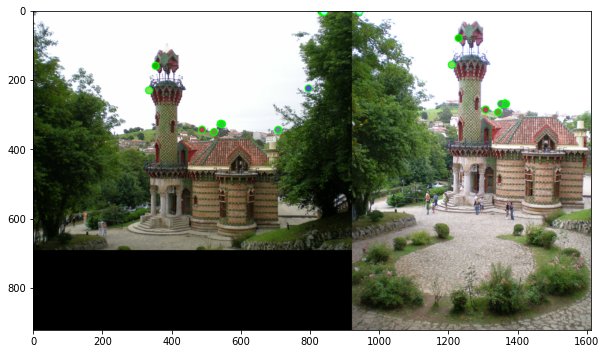

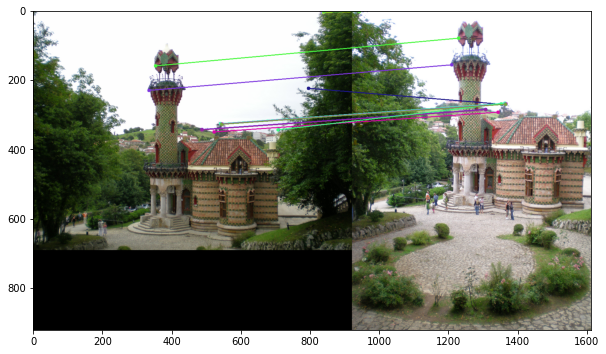

In [74]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_capricho.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_capricho.jpg', dpi=1000)


## Patheon Paris

918.2902591228984
[918.29025912 281.88483464  53.98018155 ...   1.60312195   5.57584074
  20.88300745]
[   0   12    1 ... 7334 7730 9516]
931.3431161500041
[931.34311615  50.73509633  50.45245286 ...  17.36231551  27.67399501
   6.30634601]
[   0  195  285 ... 5093 3746 1333]
1500 corners in image 1, 1500 corners in image 2


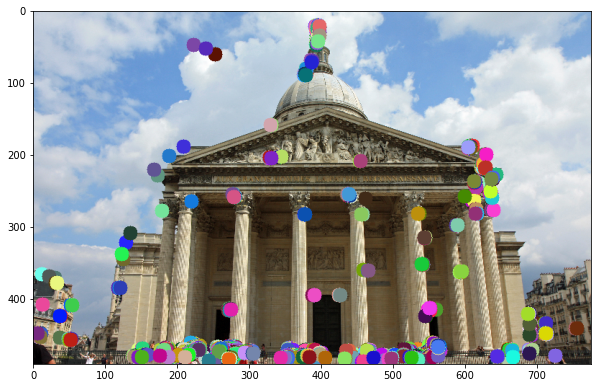

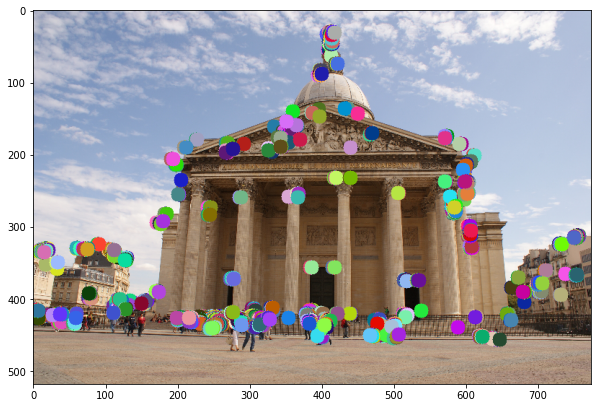

In [75]:
image1 = load_image('../data/Pantheon Paris/4872728253_3e73bd436b_o.jpg')
image2 = load_image('../data/Pantheon Paris/6005180348_c465ccf905_o.jpg')
scale_factor = 0.2
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(776, 491)
(774, 518)
27 matches from 1500 corners


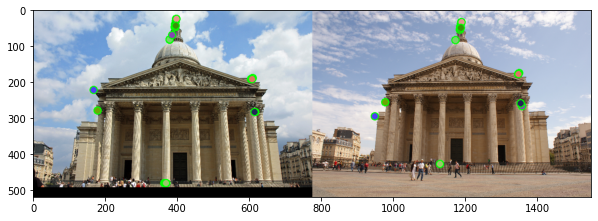

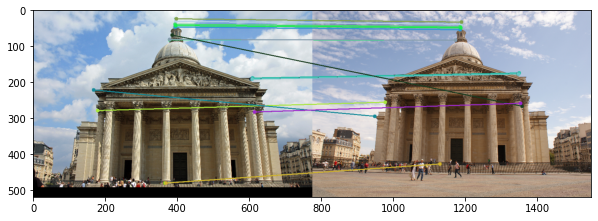

In [76]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_pantheon.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_pantheon.jpg', dpi=1000)


### Statue of Liberty

1246.134021684666
[1246.13402168  103.64251058  104.87502086 ...    6.22414653   45.70732983
    7.90759129]
[   0   13   17 ... 3365 3078 2614]
1246.134021684666
[1246.13402168   34.74622282   36.48150216 ...   40.21964694   31.78049716
   86.08513228]
[   0   45    3 ... 2017 1175 1960]
1500 corners in image 1, 1500 corners in image 2


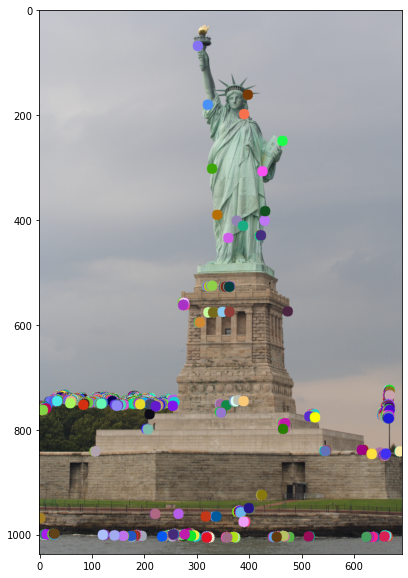

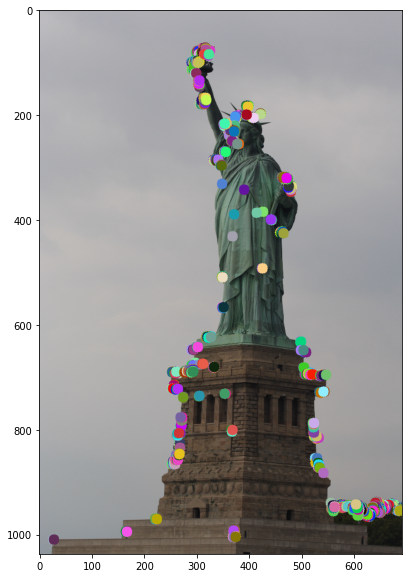

In [94]:
image1 = load_image('../data/Statue of Liberty/3055952595_24d4afe660_o.jpg')
image2 = load_image('../data/Statue of Liberty/3056777454_f9d7c29923_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(691, 1037)
(691, 1037)
34 matches from 1500 corners


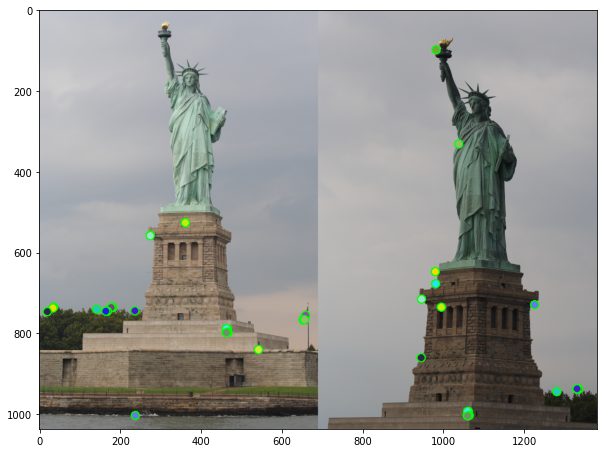

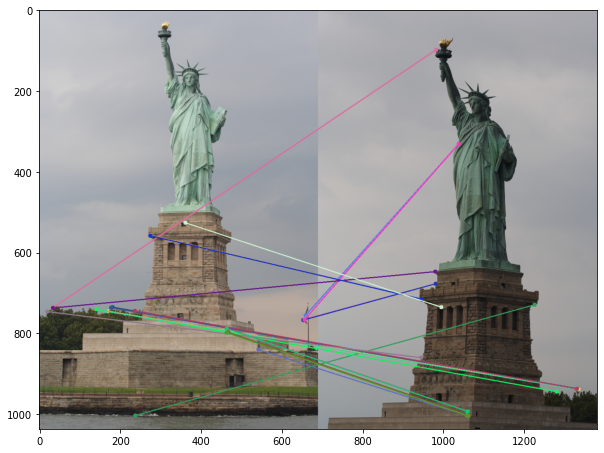

In [95]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_statue.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_statue.jpg', dpi=1000)


### Sleeping Beauty Castle

1146.4000174459175
[1146.40001745   51.46066459   52.32399067 ...    7.60591875    4.71699057
   13.71313239]
[    0     7   136 ... 10248  3593  7513]
1146.4000174459175
[1146.40001745   53.79386582   41.72349458 ...   22.8035085     7.56108458
    5.1009803 ]
[   0  640   47 ... 9170 7613 8810]
1500 corners in image 1, 1500 corners in image 2


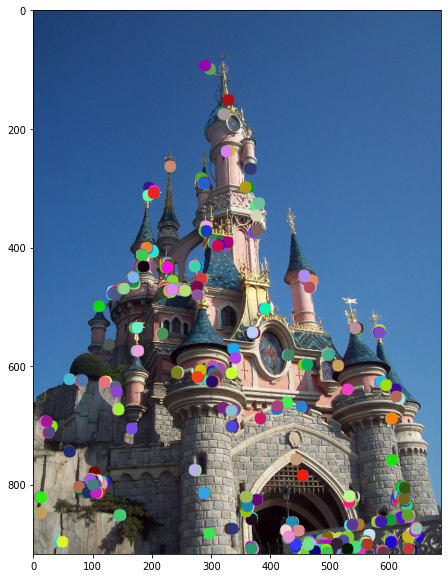

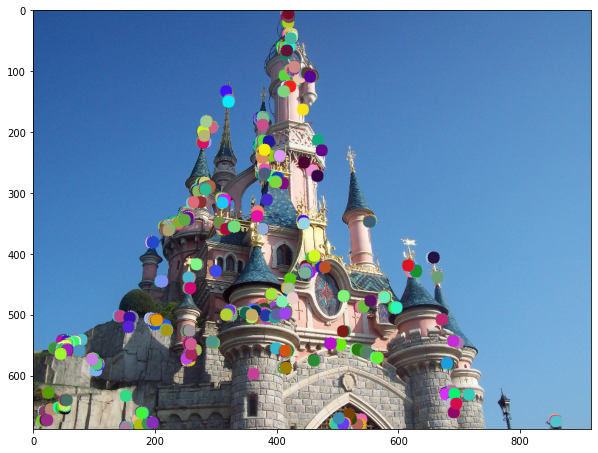

In [88]:
image1 = load_image(
    '../data/Sleeping Beauty Castle Paris/4893248701_f046f63c48_o.jpg')
image2 = load_image(
    '../data/Sleeping Beauty Castle Paris/4893249735_46343d0dd2_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(688, 917)
(917, 688)
243 matches from 1500 corners


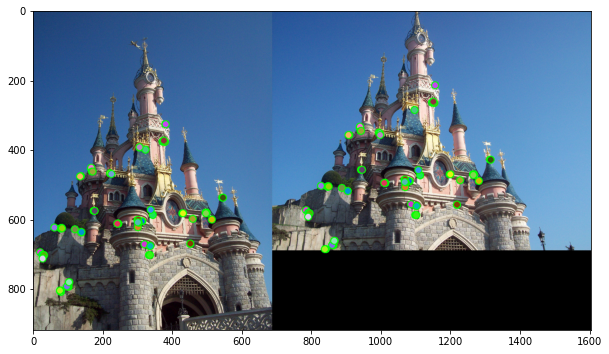

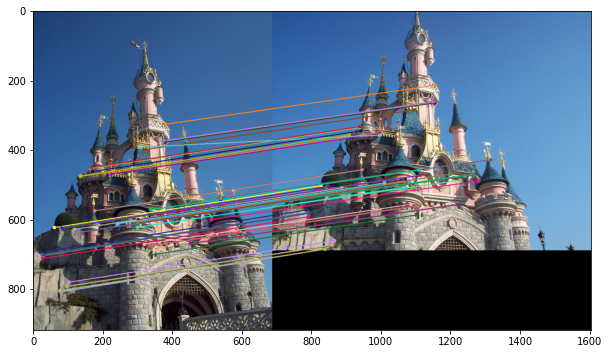

In [89]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_sleeping.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_sleeping.jpg', dpi=1000)


### Sacre Coeur

1398.401945078739
[1398.40194508   82.13093205  433.1538872  ...   21.60578626    8.07774721
   26.70299609]
[    0     2  6457 ... 23969 14438 16467]
1000.0
[1.00000000e+03 3.85145090e+02 5.68600035e+01 ... 4.12310563e-01
 1.41421356e-01 9.86813052e+00]
[    0     1    60 ... 14951 16660 12065]
1500 corners in image 1, 1500 corners in image 2


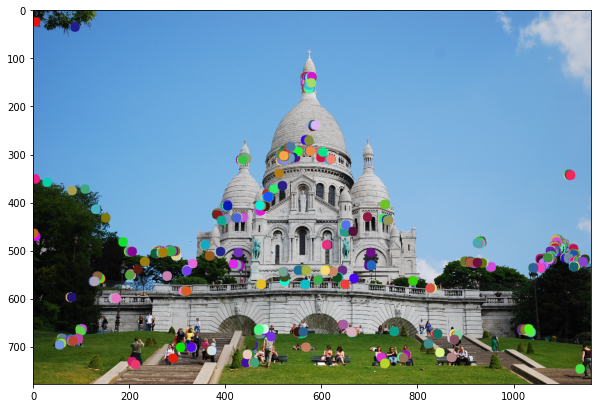

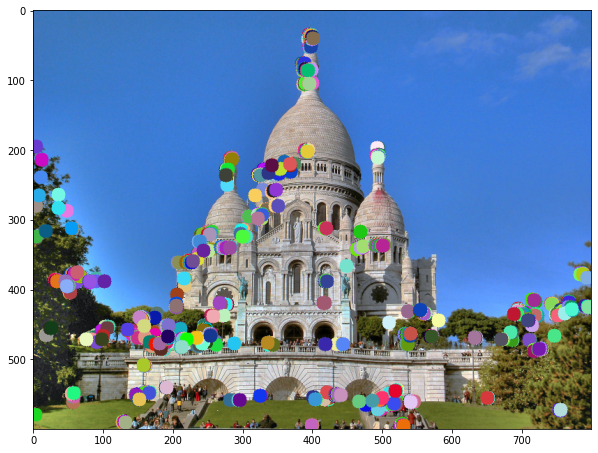

In [100]:
image1 = load_image('../data/Sacre Coeur/2589974552_c6e14695b2_o.jpg')
image2 = load_image('../data/Sacre Coeur/2647951094_d850360ce4_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=0.5, fy=0.5)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(1162, 778)
(800, 600)
14 matches from 1500 corners


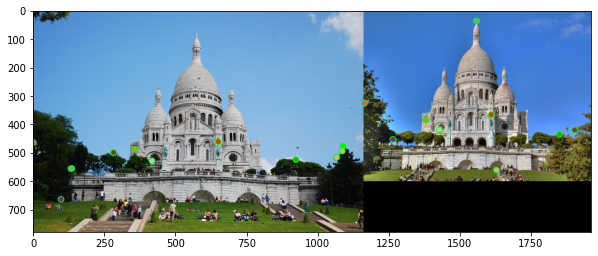

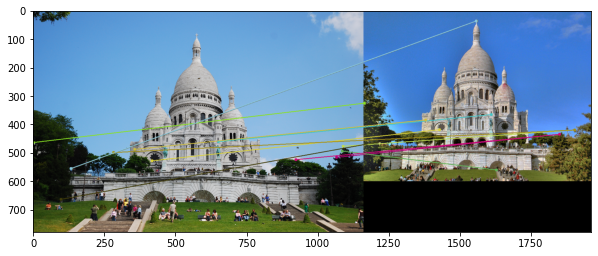

In [101]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_sacre.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_sacre.jpg', dpi=1000)
